### Import packages

In [1]:
import os
import json
import torch
import numpy as np
import random, pickle
from torchvision.utils import save_image
from src.config import opt
from src.utils import visualize_images

### Set seed

In [2]:
#random seeds
seed = 2019
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

### Load label and hyper params

In [3]:
n_classes = 30
device = opt.device
with open('mapping_dict.json','r') as f:
    mapping_dict = json.load(f)
f.close()
mapping_dict_inv = {value: key for key,value in mapping_dict.items()}

with open('my_dict_2024-12-20_07h00m41.pkl','rb') as f:
    hyper_params = pickle.load(f)
f.close()
hyper_params.keys()

dict_keys(['nz', 'fixed_noise', 'fixed_aux_labels_ohe', 'D_loss_list', 'G_loss_list'])

### Load model

In [24]:
from biggan import Generator


netGInfer = Generator(n_feat=36, codes_dim=24, n_classes=30).to(device)

netGInfer.load_state_dict(torch.load('generator_epoch250.pth',weights_only=True))


<All keys matched successfully>

### Generate Images

In [ ]:
save_dir = 'output_dir'

In [25]:
im_batch_size=30
n_images = 300
nz = hyper_params['nz']
truncated = 0.8
n_classes = 30

for i_batch in range(0, n_images, im_batch_size):
    if truncated is not None:
        flag = True
        while flag:
            z = np.random.randn(100*im_batch_size*nz)
            z = z[np.where(abs(z)<truncated)]
            if len(z)>=im_batch_size*nz:
                flag=False
        gen_z = torch.from_numpy(z[:im_batch_size*nz]).view(im_batch_size,nz,1,1)
        gen_z = gen_z.float().to(device)
    else:
        gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)

    aux_labels = np.arange((im_batch_size))
    aux_labels_ohe = np.eye(n_classes)[aux_labels]
    aux_labels_ohe = torch.from_numpy(aux_labels_ohe[:,:,np.newaxis,np.newaxis])
    aux_labels_ohe = aux_labels_ohe.float().to(device)
    
    gen_images = netGInfer(gen_z,aux_labels_ohe)
    gen_images = gen_images.to("cpu").clone().detach() #shape=(*,3,h,w), torch.Tensor
    #denormalize
    gen_images = gen_images*0.5 + 0.5

    for i_image in range(gen_images.size(0)):
        save_path = os.path.join(f'output_dir', mapping_dict_inv[aux_labels[i_image]],f'image_{i_batch}_{mapping_dict_inv[i_image]}.png')
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        save_image(gen_images[i_image, :, :, :],
                    save_path)

### Visualize results

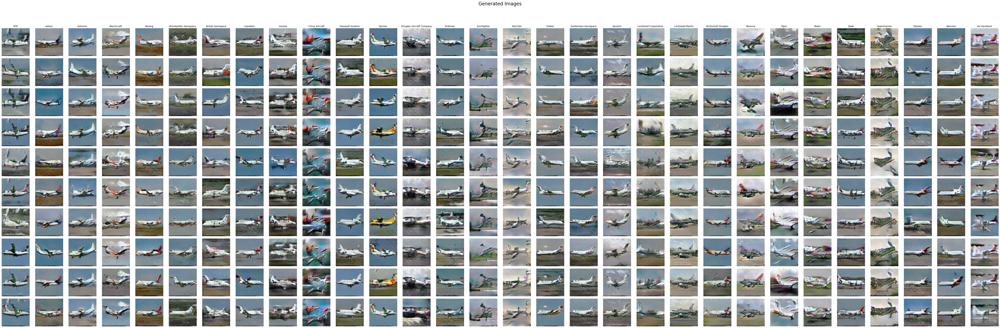

In [26]:
root_dir = "output_dir"  # Path to your generated images dir
n_classes = 30
images_per_class = 10
class_list = list(mapping_dict.keys())
visualize_images(root_dir, n_classes, class_list,images_per_class)

### Reference

[1] http://www.baguett.eu/obsidiangpt/imagedata/generativemodels/biggan.html